# Guide pour l'Appel à une API Hugging Face pour la Segmentation d'Images

Bienvenue ! Ce notebook a pour but de vous guider pas à pas dans l'utilisation de l'API d'inférence de Hugging Face pour effectuer de la segmentation d'images. La segmentation d'images consiste à attribuer une étiquette (comme "cheveux", "vêtement", "arrière-plan") à chaque pixel d'une image.

Nous allons :
1. Comprendre ce qu'est une API et comment s'y connecter.
2. Envoyer une image à un modèle de segmentation hébergé sur Hugging Face.
3. Récupérer et interpréter les résultats.
4. Visualiser les masques de segmentation.
5. Étendre cela pour traiter plusieurs images.

## 1. Configuration Initiale et Importations

Commençons par importer les bibliothèques Python nécessaires. Nous aurons besoin de :
- `os` pour interagir avec le système de fichiers (lister les images).
- `requests` pour effectuer des requêtes HTTP vers l'API.
- `PIL (Pillow)` pour manipuler les images.
- `matplotlib.pyplot` pour afficher les images et les masques.
- `numpy` pour la manipulation des tableaux (les images sont des tableaux de pixels).
- `tqdm.notebook` pour afficher une barre de progression (utile pour plusieurs images).
- `base64` et `io` pour décoder les masques renvoyés par l'API.

In [2]:
import os
import requests
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
import base64
import io
from os import listdir
from os.path import isfile, join
from dotenv import load_dotenv
import time


### Variables de Configuration

Nous devons définir quelques variables :
- `image_dir`: Le chemin vers le dossier contenant vos images. **Assurez-vous de modifier ce chemin si nécessaire.**
- `max_images`: Le nombre maximum d'images à traiter (pour ne pas surcharger l'API ou attendre trop longtemps).
- `api_token`: Votre jeton d'API Hugging Face. **IMPORTANT : Gardez ce jeton secret !**

**Comment obtenir un token API Hugging Face ?**
1. Créez un compte sur [huggingface.co](https://huggingface.co/).
2. Allez dans votre profil -> Settings -> Access Tokens.
3. Créez un nouveau token (par exemple, avec le rôle "read").
4. Copiez ce token ici.

In [3]:
# TODO: Modifiez ces valeurs selon votre configuration
image_dir = "data/IMG"  # Exemple : si vous êtes sur Colab et avez uploadé un dossier
max_images = 3  # Commençons avec peu d'images

# IMPORTANT: Remplacez "VOTRE_TOKEN_HUGGING_FACE_ICI" par votre véritable token API.
# Ne partagez jamais votre token publiquement.
load_dotenv('.env')
api_token = %env HUGGING_FACE_TOKEN
del os.environ['HUGGING_FACE_TOKEN']
del os.environ['HF_TOKEN']
# Créons le dossier d'images s'il n'existe pas (pour l'exemple)
if not os.path.exists(image_dir):
    os.makedirs(image_dir)
    print(f"Dossier '{image_dir}' créé. Veuillez y ajouter des images .jpg ou .png.")
else:
    print(f"Dossier '{image_dir}' existant.")

if api_token == "VOTRE_TOKEN_HUGGING_FACE_ICI":
    print("\nATTENTION : Vous devez remplacer 'VOTRE_TOKEN_HUGGING_FACE_ICI' par votre token API personnel.")


Dossier 'data/IMG' existant.


## 2. Comprendre l'API d'Inférence Hugging Face

L'API d'inférence permet d'utiliser des modèles hébergés sur Hugging Face sans avoir à les télécharger ou à gérer l'infrastructure.

- **Modèle utilisé** : Nous allons utiliser le modèle `sayeed99/segformer_b3_clothes`, spécialisé dans la segmentation de vêtements et de parties du corps.
- **URL de l'API** : L'URL pour un modèle est généralement `https://api-inference.huggingface.co/models/NOM_DU_MODELE`.
- **Headers (En-têtes)** : Pour s'authentifier et spécifier le type de contenu, nous envoyons des en-têtes avec notre requête.
    - `Authorization`: Contient notre token API (précédé de `Bearer `).
    - `Content-Type`: Indique que nous envoyons une image au format JPEG (ou PNG selon le cas).

In [4]:
API_URL = "https://api-inference.huggingface.co/models/sayeed99/segformer_b3_clothes" # Remplacez ... par le bon endpoint.
headers = {
    "Authorization": f"Bearer {api_token}"
    # Le "Content-Type" sera ajouté dynamiquement lors de l'envoi de l'image
}

# Lister les chemins des images à traiter
# Assurez-vous d'avoir des images dans le dossier 'image_dir'!
image_paths = [os.path.join(image_dir, f) for f in listdir(image_dir) if isfile(join(image_dir, f))] # A vous de jouer !
print(image_paths)

if not image_paths:
    print(f"Aucune image trouvée dans '{image_dir}'. Veuillez y ajouter des images.")
else:
    print(f"{len(image_paths)} image(s) à traiter : {image_paths}")

['data/IMG/image_36.png', 'data/IMG/image_10.png', 'data/IMG/image_38.png', 'data/IMG/image_30.png', 'data/IMG/image_11.png', 'data/IMG/image_6.png', 'data/IMG/image_49.png', 'data/IMG/image_33.png', 'data/IMG/image_35.png', 'data/IMG/image_31.png', 'data/IMG/image_37.png', 'data/IMG/image_21.png', 'data/IMG/image_18.png', 'data/IMG/image_16.png', 'data/IMG/image_3.png', 'data/IMG/image_19.png', 'data/IMG/image_34.png', 'data/IMG/image_40.png', 'data/IMG/image_48.png', 'data/IMG/image_41.png', 'data/IMG/image_42.png', 'data/IMG/image_32.png', 'data/IMG/image_46.png', 'data/IMG/image_15.png', 'data/IMG/image_25.png', 'data/IMG/image_27.png', 'data/IMG/image_13.png', 'data/IMG/image_7.png', 'data/IMG/image_9.png', 'data/IMG/image_8.png', 'data/IMG/image_44.png', 'data/IMG/image_28.png', 'data/IMG/image_12.png', 'data/IMG/image_17.png', 'data/IMG/image_45.png', 'data/IMG/image_5.png', 'data/IMG/image_1.png', 'data/IMG/image_14.png', 'data/IMG/image_23.png', 'data/IMG/image_26.png', 'data/

## 3. Fonctions Utilitaires pour le Traitement des Masques

Le modèle que nous utilisons (`sayeed99/segformer_b3_clothes`) renvoie des masques pour différentes classes (cheveux, chapeau, etc.). Ces masques sont encodés en base64. Les fonctions ci-dessous sont fournies pour vous aider à :
1.  `CLASS_MAPPING`: Un dictionnaire qui associe les noms de classes (ex: "Hat") à des identifiants numériques.
2.  `get_image_dimensions`: Récupérer les dimensions d'une image.
3.  `decode_base64_mask`: Décoder un masque de base64 en une image (tableau NumPy) et le redimensionner.
4.  `create_masks`: Combiner les masques de toutes les classes détectées en un seul masque de segmentation final, où chaque pixel a la valeur de l'ID de sa classe.

**Cette partie est donnée car elle est spécifique au format de sortie de ce modèle et un peu complexe pour une première approche.** Lisez-la pour comprendre son rôle, mais ne vous attardez pas sur les détails d'implémentation pour l'instant.

In [5]:
CLASS_MAPPING = {
    "Background": 0,
    "Hat": 1,
    "Hair": 2,
    "Sunglasses": 3,
    "Upper-clothes": 4,
    "Skirt": 5,
    "Pants": 6,
    "Dress": 7,
    "Belt": 8,
    "Left-shoe": 9,
    "Right-shoe": 10,
    "Face": 11,
    "Left-leg": 12,
    "Right-leg": 13,
    "Left-arm": 14,
    "Right-arm": 15,
    "Bag": 16,
    "Scarf": 17
}

def get_image_dimensions(img_path):
    """
    Get the dimensions of an image.

    Args:
        img_path (str): Path to the image.

    Returns:
        tuple: (width, height) of the image.
    """
    original_image = Image.open(img_path)
    return original_image.size

def decode_base64_mask(base64_string, width, height):
    """
    Decode a base64-encoded mask into a NumPy array.

    Args:
        base64_string (str): Base64-encoded mask.
        width (int): Target width.
        height (int): Target height.

    Returns:
        np.ndarray: Single-channel mask array.
    """
    mask_data = base64.b64decode(base64_string)
    mask_image = Image.open(io.BytesIO(mask_data))
    mask_array = np.array(mask_image)
    if len(mask_array.shape) == 3:
        mask_array = mask_array[:, :, 0]  # Take first channel if RGB
    mask_image = Image.fromarray(mask_array).resize((width, height), Image.NEAREST)
    return np.array(mask_image)

def create_masks(results, width, height):
    """
    Combine multiple class masks into a single segmentation mask.

    Args:
        results (list): List of dictionaries with 'label' and 'mask' keys.
        width (int): Target width.
        height (int): Target height.

    Returns:
        np.ndarray: Combined segmentation mask with class indices.
    """
    combined_mask = np.zeros((height, width), dtype=np.uint8)  # Initialize with Background (0)

    # Process non-Background masks first
    for result in results:
        label = result['label']
        class_id = CLASS_MAPPING.get(label, 0)
        if class_id == 0:  # Skip Background
            continue
        mask_array = decode_base64_mask(result['mask'], width, height)
        combined_mask[mask_array > 0] = class_id

    # Process Background last to ensure it doesn't overwrite other classes unnecessarily
    # (Though the model usually provides non-overlapping masks for distinct classes other than background)
    for result in results:
        if result['label'] == 'Background':
            mask_array = decode_base64_mask(result['mask'], width, height)
            # Apply background only where no other class has been assigned yet
            # This logic might need adjustment based on how the model defines 'Background'
            # For this model, it seems safer to just let non-background overwrite it first.
            # A simple application like this should be fine: if Background mask says pixel is BG, set it to 0.
            # However, a more robust way might be to only set to background if combined_mask is still 0 (initial value)
            combined_mask[mask_array > 0] = 0 # Class ID for Background is 0

    return combined_mask

In [4]:
import cv2

custom_colormap = {
    1: (0, 255, 255),   # Jaune - Hat
    2: (0, 165, 255),   # Orange - Hair
    3: (255, 0, 255),   # Magenta - Sunglasses
    4: (0, 0, 255),     # Rouge - Upper-clothes
    5: (255, 255, 0),   # Cyan - Skirt
    6: (0, 255, 0),     # Vert - Pants
    7: (255, 0, 0),     # Bleu - Dress
    8: (128, 0, 128),   # Violet - Belt
    9: (0, 255, 255),   # Jaune - Left-shoe
    10: (255, 140, 0),  # Orange foncé - Right-shoe
    11: (200, 180, 140), # Beige - Face
    12: (200, 180, 140), # Beige - Left-leg
    13: (200, 180, 140), # Beige - Right-leg
    14: (200, 180, 140), # Beige - Left-arm
    15: (200, 180, 140), # Beige - Right-arm
    16: (0, 128, 255),  # Bleu clair - Bag
    17: (255, 20, 147)  # Rose - Scarf
}

# Légendes associées aux labels
legend_labels = {
    "0": "Background",
    "1": "Hat",
    "2": "Hair",
    "3": "Sunglasses",
    "4": "Upper-clothes",
    "5": "Skirt",
    "6": "Pants",
    "7": "Dress",
    "8": "Belt",
    "9": "Left-shoe",
    "10": "Right-shoe",
    "11": "Face",
    "12": "Left-leg",
    "13": "Right-leg",
    "14": "Left-arm",
    "15": "Right-arm",
    "16": "Bag",
    "17": "Scarf"
}

def add_legend(image, legend, start_x=10, start_y=10, box_size=15, spacing=5):
    """
    Ajoute une légende sur l'image.
    Pour chaque label, dessine un rectangle de la couleur correspondante et le texte associé.
    """
    img_with_legend = image.copy()
    y = start_y
    for label, text in legend.items():
        # Récupération de la couleur du label
        color = custom_colormap.get(int(label), (255, 255, 255))
        # Dessin d'un petit rectangle rempli
        cv2.rectangle(img_with_legend, (start_x, y), (start_x + box_size, y + box_size), color, -1)
        # Ajout du texte à droite du rectangle
        cv2.putText(img_with_legend, text, (start_x + box_size + spacing, y + box_size - 2),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1, cv2.LINE_AA)
        y += box_size + spacing
    return img_with_legend

def colorize_mask(mask, colormap):
    """
    Applique le colormap personnalisé au masque.
    Pour chaque pixel, s'il correspond à un label défini dans colormap,
    la couleur correspondante est assignée.
    """
    colored_mask = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)
    for label, color in colormap.items():
        colored_mask[mask == label] = color
    return colored_mask

## 4. Segmentation d'une Seule Image

Avant de traiter toutes les images, concentrons-nous sur une seule pour bien comprendre le processus.

Étapes :
1.  Choisir une image.
2.  Ouvrir l'image en mode binaire (`"rb"`) et lire son contenu (`data`).
3.  Déterminer le `Content-Type` (par exemple, `"image/jpeg"` ou `"image/png"`).
4.  Envoyer la requête POST à l'API avec `requests.post()` en passant l'URL, les headers et les données.
5.  Vérifier le code de statut de la réponse. Une erreur sera levée si le code n'est pas 2xx (succès) grâce à `response.raise_for_status()`.
6.  Convertir la réponse JSON en un dictionnaire Python avec `response.json()`.
7.  Utiliser nos fonctions `get_image_dimensions` et `create_masks` pour obtenir le masque final.
8.  Afficher l'image originale et le masque segmenté.

Traitement de l'image : data/IMG/image_36.png
<Response [200]>


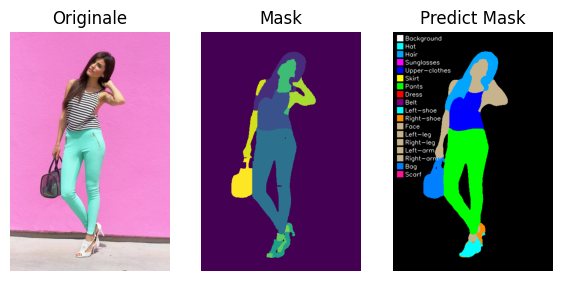

In [ ]:
if image_paths:
    single_image_path = image_paths[0] # Prenons la première image de notre liste
    print(f"Traitement de l'image : {single_image_path}")

    try:
        # Lire l'image en binaire
        # Et mettez le contenu de l'image dans la variable image_data
        # A vous de jouer !
        with open(single_image_path, "rb") as f:
            image_data = f.read()
        
        extension = single_image_path.split('.')[1]
        if extension == "png" or extension == "jpg" :
            content_type = "image/" + extension
            response = requests.post(API_URL, headers={"Content-Type": content_type, **headers}, data=image_data)
            response.raise_for_status()
            print(response)
            response_json = response.json()
            width, height = get_image_dimensions(single_image_path)
            combine_mask = create_masks(response_json, width, height)

            Image.fromarray(combine_mask).save(single_image_path.replace("IMG/image_", "P_mask/p_mask_"))

            
            image_visual = plt.imread(single_image_path)
            real_mask_path = single_image_path.replace("IMG/image_", "Mask/mask_")
            real_mask = plt.imread(real_mask_path)
            fig, ax = plt.subplot_mosaic([
                ['originale', 'mask', 'predict_mask']
            ], figsize=(7, 3.5))
            ax['originale'].imshow(image_visual)
            ax['originale'].axis('off')
            ax['originale'].set_title('Originale')

            ax['mask'].imshow(real_mask)
            ax['mask'].axis('off')
            ax['mask'].set_title('Mask')

            combine_mask = colorize_mask(combine_mask, custom_colormap)
            combine_mask = add_legend(combine_mask, legend_labels)
            ax['predict_mask'].imshow(combine_mask)
            ax['predict_mask'].axis('off')
            ax['predict_mask'].set_title('Predict Mask')


            
            plt.show()
            # Maintenant, utilisé l'API huggingface
            # ainsi que les fonctions données plus haut pour ségmenter vos images.

    except Exception as e:
        print(f"Une erreur est survenue : {e}")
else:
    print("Aucune image à traiter. Vérifiez la configuration de 'image_dir' et 'max_images'.")

## 5. Segmentation de Plusieurs Images (Batch)

Maintenant que nous savons comment traiter une image, nous pouvons créer une fonction pour en traiter plusieurs.
Cette fonction va boucler sur la liste `image_paths` et appliquer la logique de segmentation à chaque image.
Nous utiliserons `tqdm` pour avoir une barre de progression.

In [11]:
def segment_images_batch(list_of_image_paths):
    """
    Segmente une liste d'images en utilisant l'API Hugging Face.

    Args:
        list_of_image_paths (list): Liste des chemins vers les images.

    Returns:
        list: Liste des masques de segmentation (tableaux NumPy).
              Contient None si une image n'a pas pu être traitée.
    """
    batch_segmentations = []
    for i in tqdm(range(len(list_of_image_paths))):
        single_image_path = list_of_image_paths[i]
        with open(single_image_path, "rb") as f:
            image_data = f.read()
        

        response = requests.post(API_URL, headers={"Content-Type": "image/png", **headers}, data=image_data)
        response.raise_for_status()
        response_json = response.json()
        width, height = get_image_dimensions(single_image_path)
        combine_mask = create_masks(response_json, width, height)
        
        image_visual = plt.imread(single_image_path)
        batch_segmentations.append(combine_mask)
        time.sleep(1)
    

    # N'oubliez pas de mettre une pause entre chaque appel API !


    return batch_segmentations

# Appeler la fonction pour segmenter les images listées dans image_paths
if image_paths:
    print(f"\nTraitement de {len(image_paths)} image(s) en batch...")
    batch_seg_results = segment_images_batch(image_paths)
    print("Traitement en batch terminé.")
else:
    batch_seg_results = []
    print("Aucune image à traiter en batch.")


Traitement de 50 image(s) en batch...


100%|██████████| 50/50 [01:48<00:00,  2.18s/it]

Traitement en batch terminé.


## 6. Affichage des Résultats en Batch

Nous allons maintenant créer une fonction pour afficher les images originales et leurs segmentations correspondantes côte à côte, dans une grille.

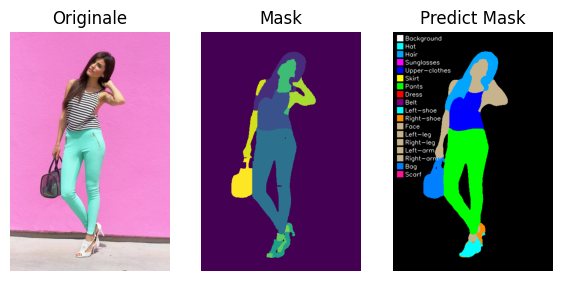

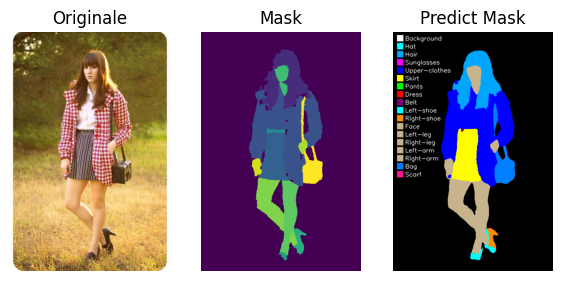

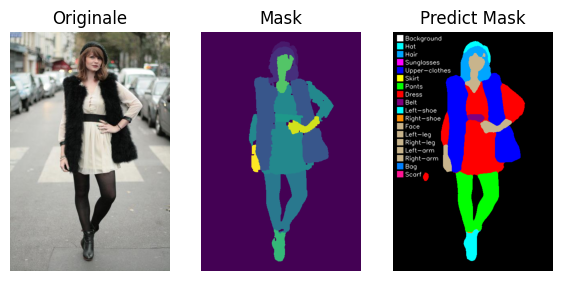

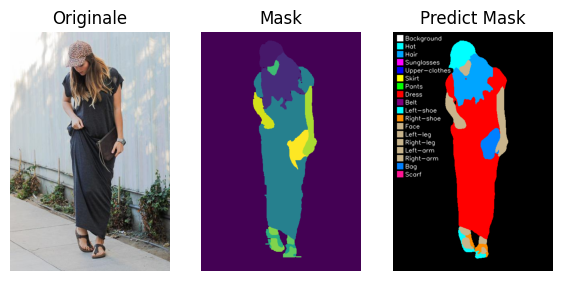

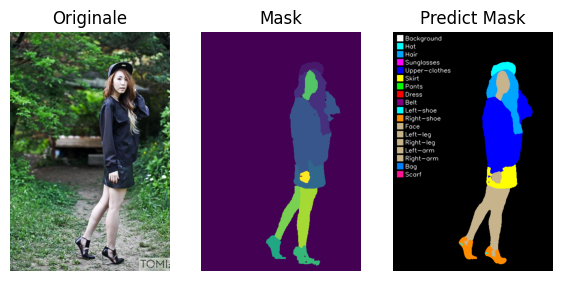

...

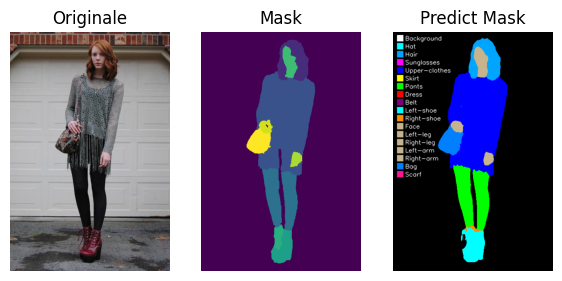

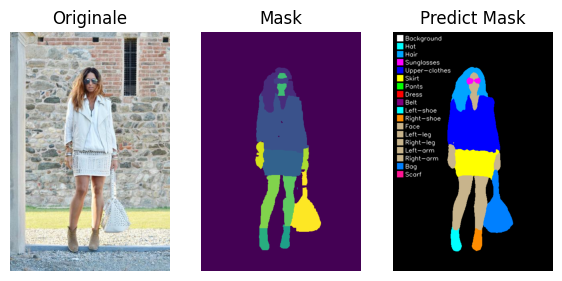

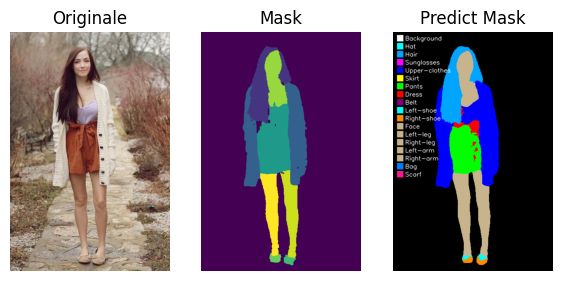

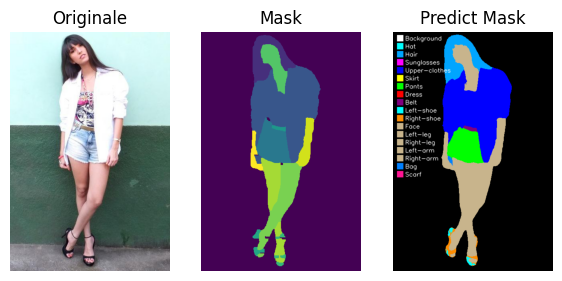

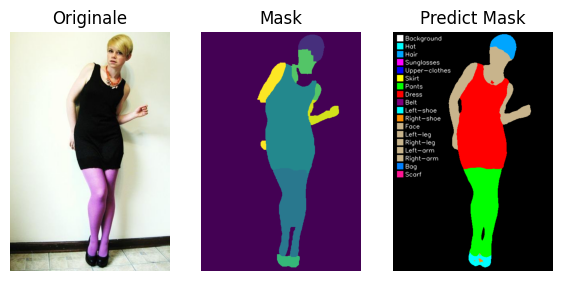

In [60]:
def display_segmented_images_batch(original_image_paths, segmentation_masks):
    """
    Affiche les images originales et leurs masques segmentés.

    Args:
        original_image_paths (list): Liste des chemins des images originales.
        segmentation_masks (list): Liste des masques segmentés (NumPy arrays).
    """
    if len(original_image_paths) == len(segmentation_masks):
        for i in range(len(original_image_paths)):
            image_visual = plt.imread(original_image_paths[i])
            combine_mask = segmentation_masks[i]
            Image.fromarray(combine_mask).save(original_image_paths[i].replace("IMG/image_", "P_mask/p_mask_"))
            real_mask_path = original_image_paths[i].replace("IMG/image_", "Mask/mask_")
            real_mask = plt.imread(real_mask_path)
            fig, ax = plt.subplot_mosaic([
                ['originale', 'mask', 'predict_mask']
            ], figsize=(7, 3.5))
            ax['originale'].imshow(image_visual)
            ax['originale'].axis('off')
            ax['originale'].set_title('Originale')

            ax['mask'].imshow(real_mask)
            ax['mask'].axis('off')
            ax['mask'].set_title('Mask')

            combine_mask = colorize_mask(combine_mask, custom_colormap)
            combine_mask = add_legend(combine_mask, legend_labels)
            ax['predict_mask'].imshow(combine_mask)
            ax['predict_mask'].axis('off')
            ax['predict_mask'].set_title('Predict Mask')
            
            plt.show()
    # Matplotlib, ça vous parle ?
    # Alors... au travail ! 😉

# Afficher les résultats du batch
if batch_seg_results:
    display_segmented_images_batch(image_paths, batch_seg_results)
else:
    print("Aucun résultat de segmentation à afficher.")

## Conclusion et Prochaines Étapes

Félicitations ! Vous avez appris à :
- Configurer les appels à l'API d'inférence Hugging Face.
- Envoyer des images pour la segmentation.
- Interpréter les résultats (avec l'aide des fonctions fournies).
- Visualiser les segmentations.

Pistes d'amélioration ou d'exploration :
- **Gestion d'erreurs plus fine** : Implémenter des tentatives multiples (retry) en cas d'échec de l'API (par exemple, si le modèle est en cours de chargement).
- **Appels asynchrones** : Pour un grand nombre d'images, des appels asynchrones (avec `asyncio` et `aiohttp`) seraient beaucoup plus rapides.
- **Autres modèles** : Explorer d'autres modèles de segmentation ou d'autres tâches sur Hugging Face Hub.

N'hésitez pas à modifier le code, à tester avec vos propres images et à explorer davantage !

**_Note_** : Si vous aimez ce modèle, n'hésitez pas à le [télécharger](https://huggingface.co/sayeed99/segformer_b3_clothes) et jouer avec directement sur votre machine !

Lecture des paires image/mask effectuée.
Résultat pour la paire 0 :


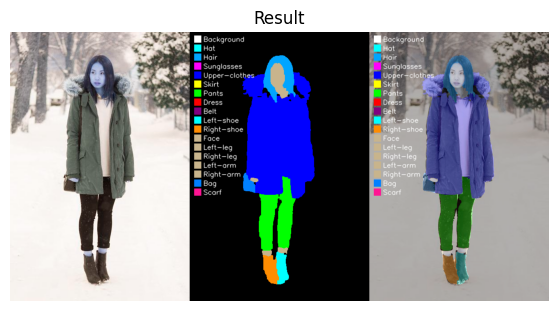

Résultat pour la paire 1 :


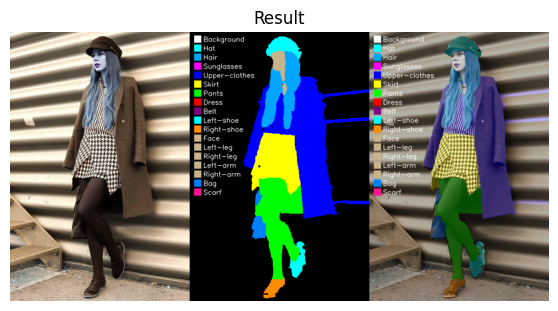

Résultat pour la paire 2 :


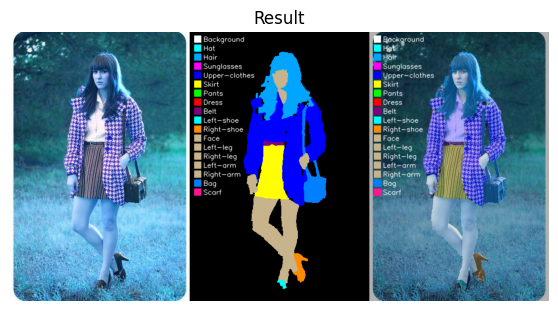

Résultat pour la paire 3 :


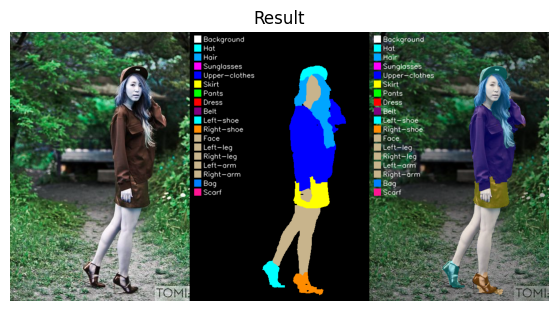

Résultat pour la paire 4 :


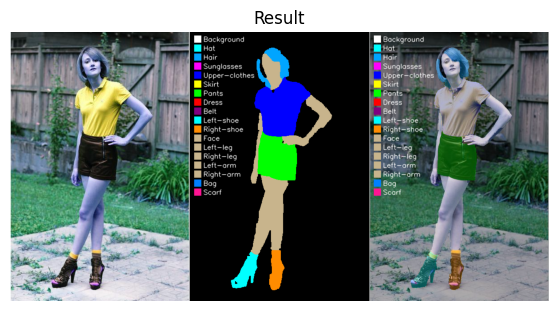

Résultat pour la paire 5 :


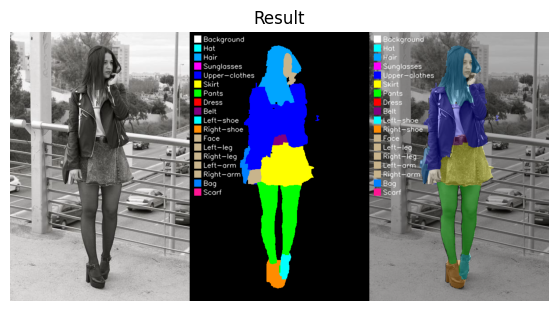

Résultat pour la paire 6 :


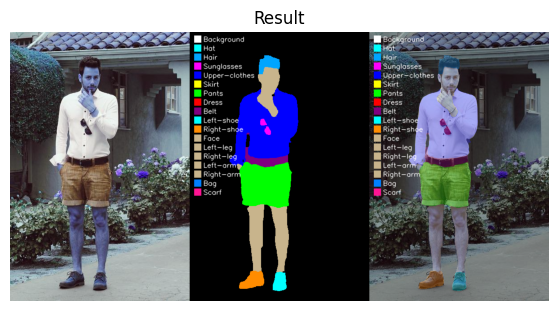

Résultat pour la paire 7 :


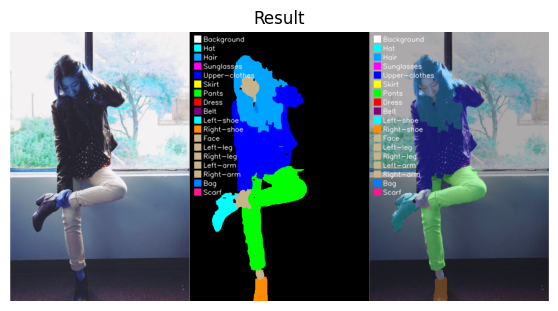

Résultat pour la paire 8 :


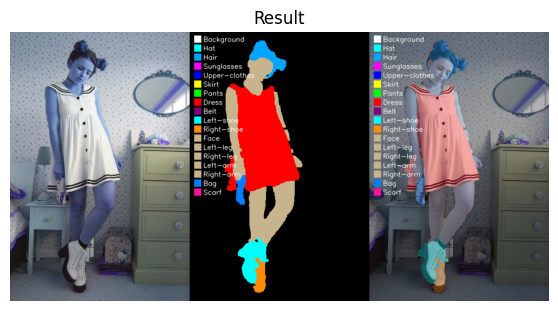

Résultat pour la paire 9 :


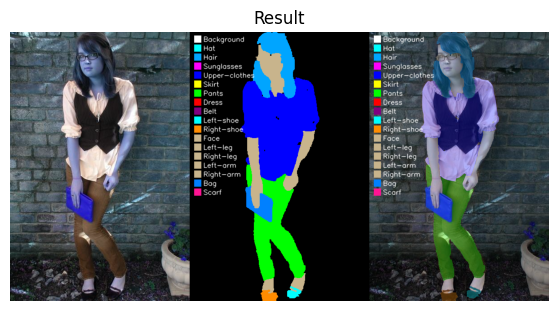

Résultat pour la paire 10 :


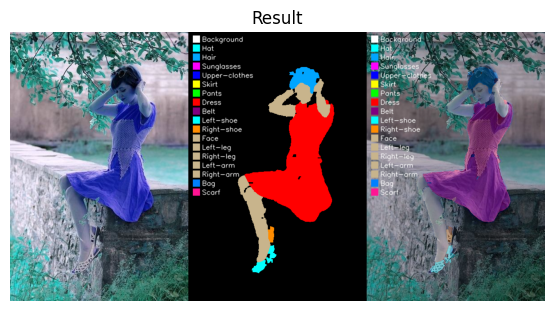

Résultat pour la paire 11 :


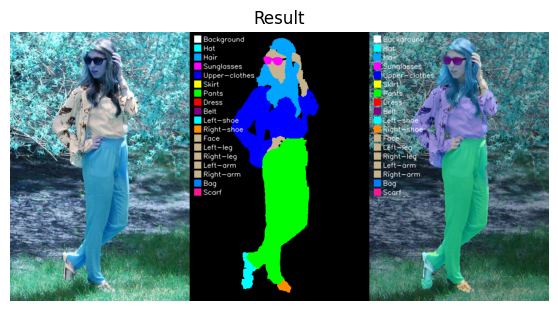

Résultat pour la paire 12 :


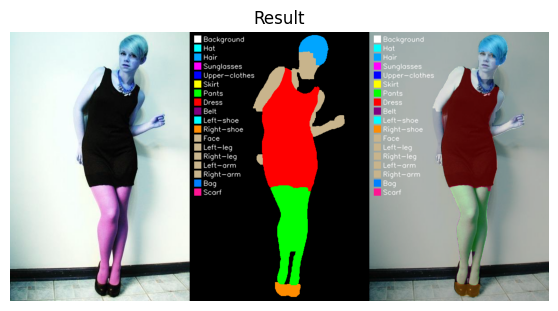

Résultat pour la paire 13 :


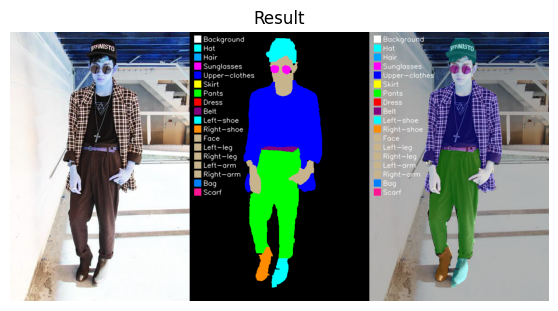

Résultat pour la paire 14 :


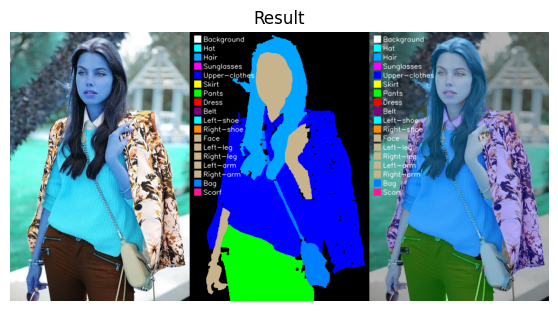

Résultat pour la paire 15 :


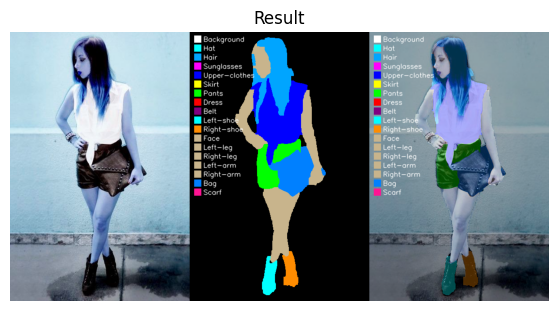

Résultat pour la paire 16 :


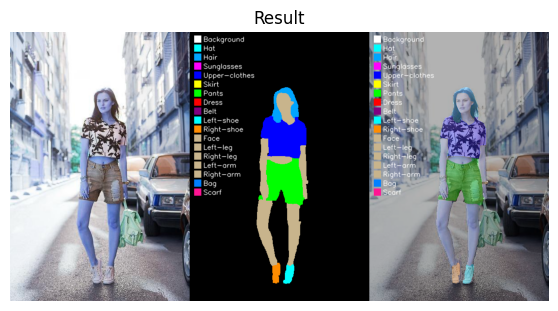

Résultat pour la paire 17 :


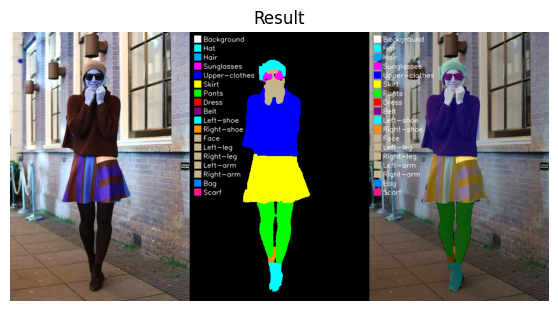

Résultat pour la paire 18 :


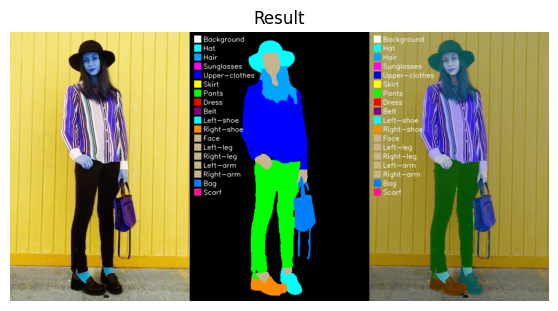

Résultat pour la paire 19 :


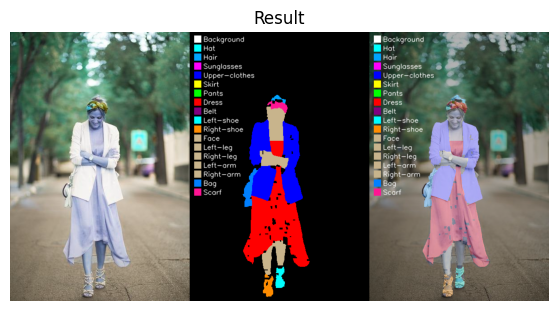

Résultat pour la paire 20 :


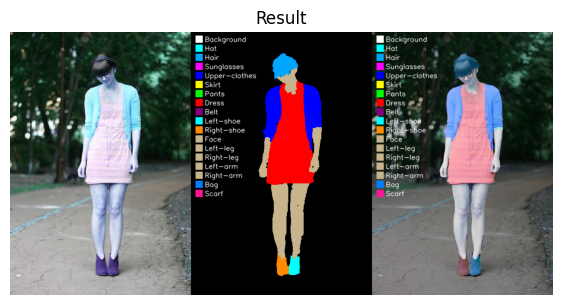

Résultat pour la paire 21 :


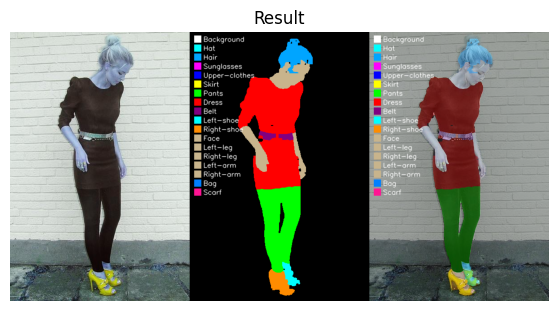

Résultat pour la paire 22 :


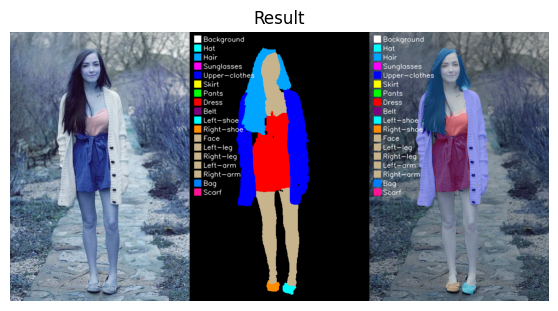

Résultat pour la paire 23 :


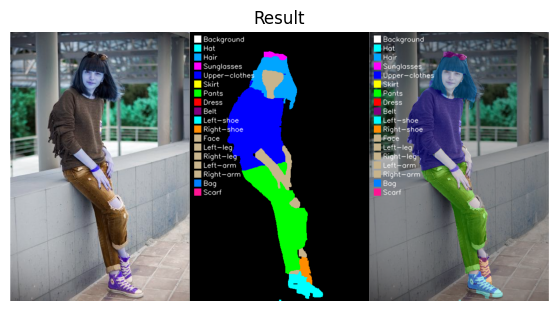

Résultat pour la paire 24 :


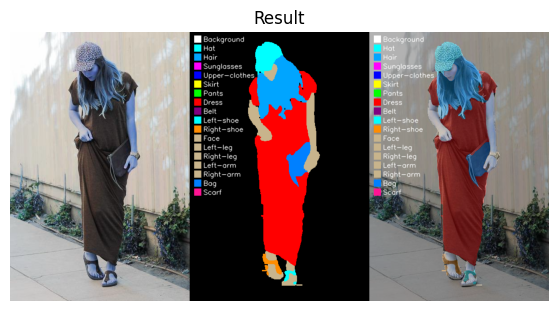

Résultat pour la paire 25 :


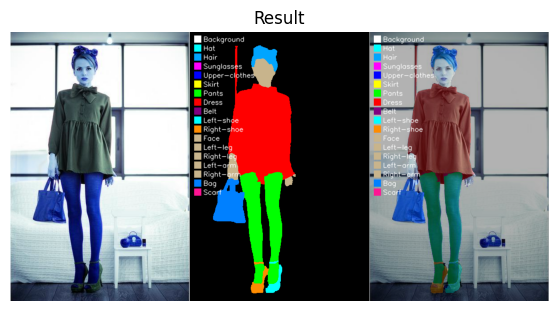

Résultat pour la paire 26 :


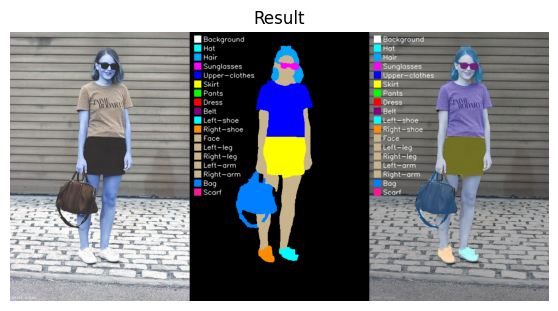

Résultat pour la paire 27 :


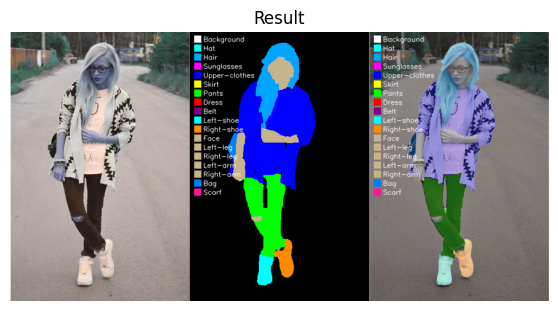

Résultat pour la paire 28 :


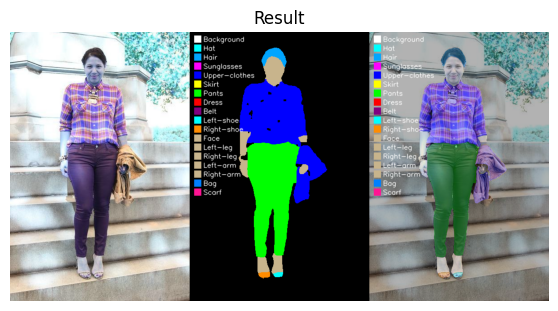

Résultat pour la paire 29 :


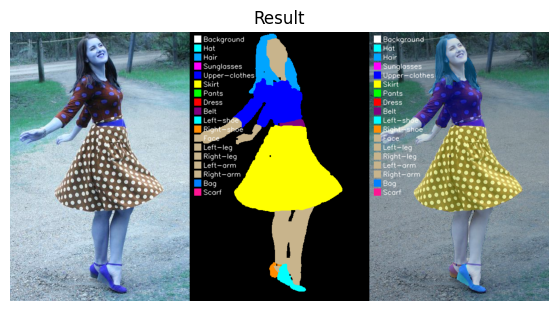

Résultat pour la paire 30 :


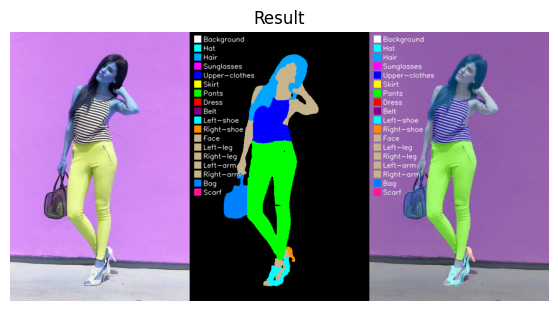

Résultat pour la paire 31 :


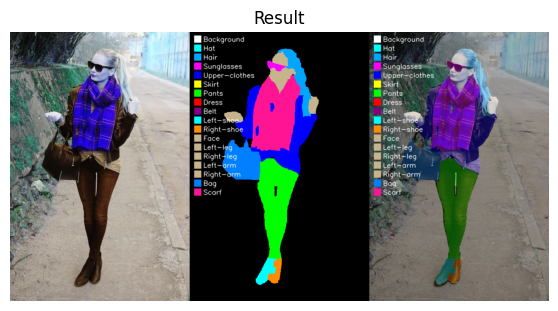

Résultat pour la paire 32 :


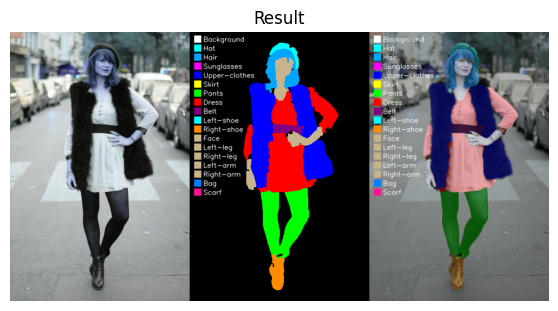

Résultat pour la paire 33 :


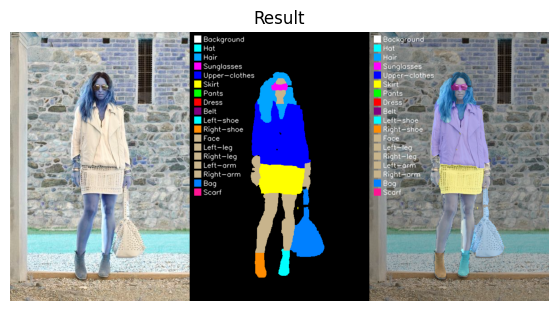

Résultat pour la paire 34 :


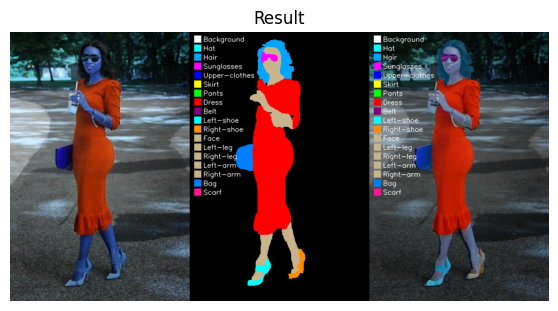

Résultat pour la paire 35 :


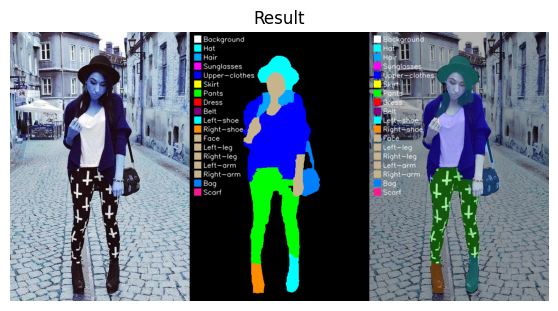

Résultat pour la paire 36 :


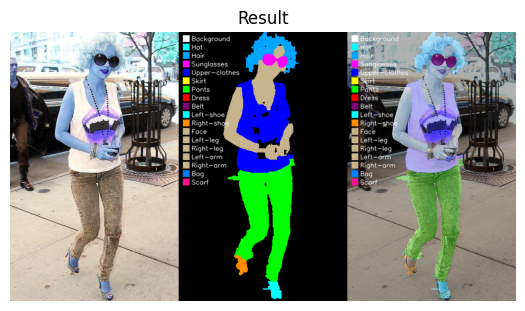

Résultat pour la paire 37 :


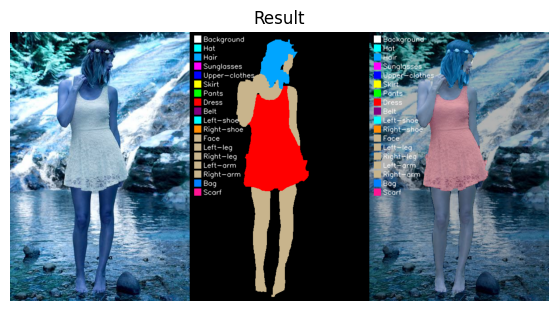

Résultat pour la paire 38 :


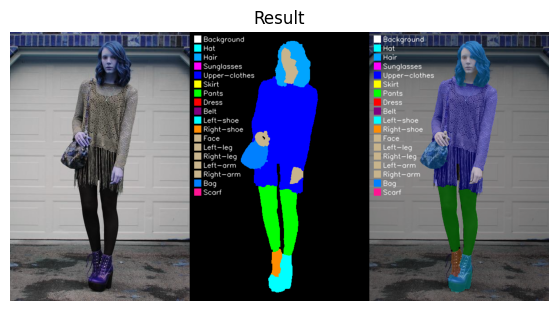

Résultat pour la paire 39 :


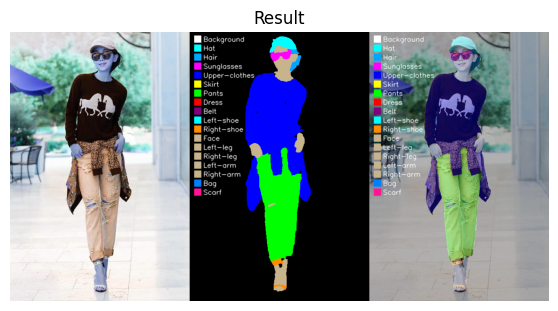

Résultat pour la paire 40 :


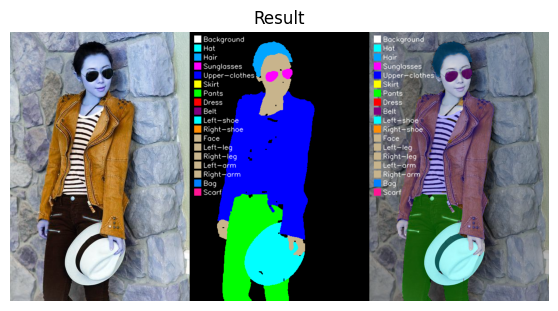

Résultat pour la paire 41 :


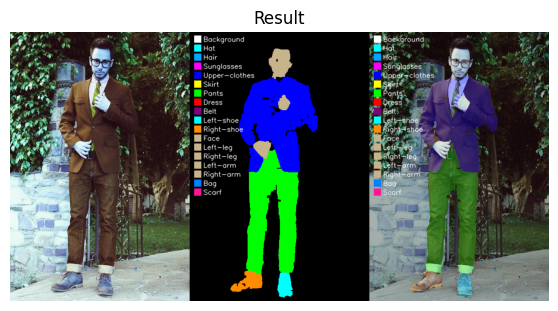

Résultat pour la paire 42 :


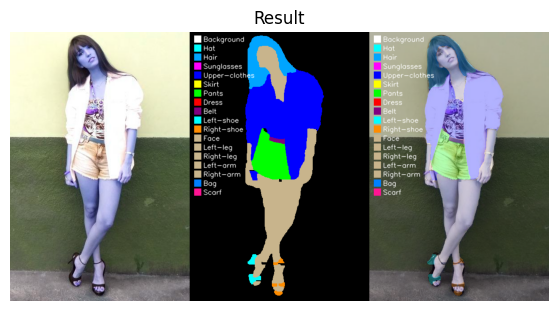

Résultat pour la paire 43 :


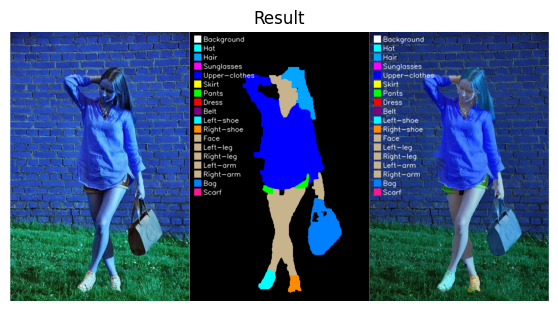

Résultat pour la paire 44 :


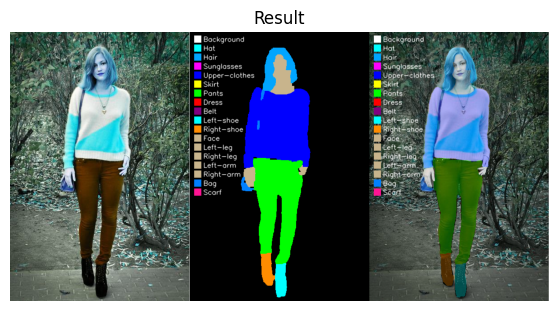

Résultat pour la paire 45 :


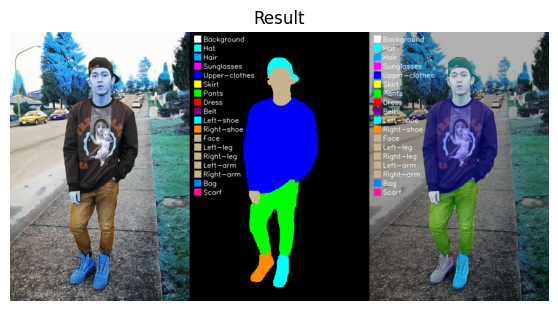

Résultat pour la paire 46 :


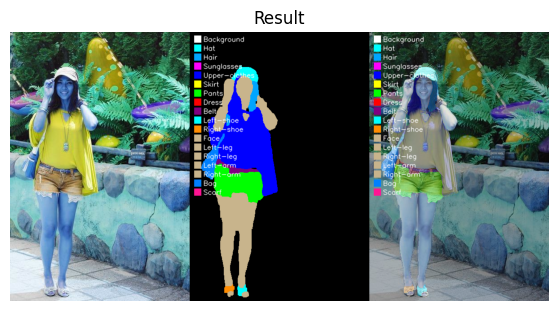

Résultat pour la paire 47 :


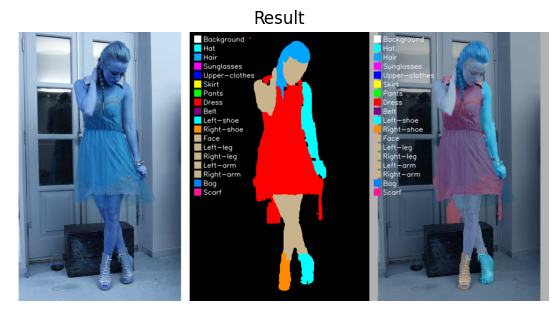

Résultat pour la paire 48 :


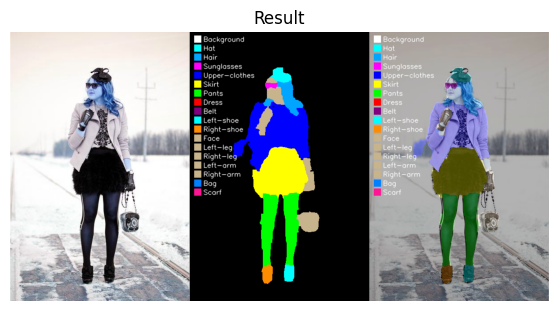

Résultat pour la paire 49 :


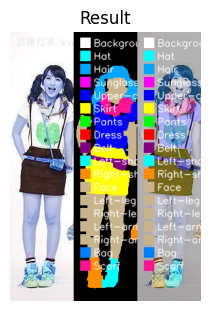

In [38]:
paires = []
img_files = sorted(os.listdir("data/IMG"))
mask_files = sorted(os.listdir("data/Mask"))
for img_file, mask_file in zip(img_files, mask_files ):
    img_path = os.path.join("data/IMG", img_file)
    mask_path = os.path.join("data/Mask", mask_file)
    
    image = cv2.imread(img_path)                       # Image en couleur
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)   # Masque en niveaux de gris

    paires.append((image, mask))

print("Lecture des paires image/mask effectuée.")

for idx, (img, msk) in enumerate(paires):
    # Colorisation du masque avec le colormap personnalisé
    colored_mask = colorize_mask(msk, custom_colormap)

    # Ajout de la légende sur le masque colorisé
    colored_mask_with_legend = add_legend(colored_mask, legend_labels)

    # Superposition du masque coloré sur l'image originale
    overlay = cv2.addWeighted(img, 0.7, colored_mask, 0.3, 0)
    overlay_with_legend = add_legend(overlay, legend_labels)

    # Concatenation des images sur une seule ligne
    concatenated = np.hstack([img, colored_mask_with_legend, overlay_with_legend])

    # Affichage des résultats dans Colab
    print(f"Résultat pour la paire {idx} :")

    fig, ax = plt.subplot_mosaic([
                ['result']
            ], figsize=(7, 3.5))
    ax['result'].imshow(concatenated)
    ax['result'].axis('off')
    ax['result'].set_title('Result')

    plt.show()

In [6]:
import skimage as ski
paires_mask = []
p_mask_files = sorted(os.listdir("data/P_mask"))
mask_files = sorted(os.listdir("data/Mask"))
for p_mask_file, mask_file in zip(p_mask_files, mask_files ):
    p_mask_path = os.path.join("data/P_mask", p_mask_file)
    mask_path = os.path.join("data/Mask", mask_file)
    
    image = cv2.imread(p_mask_path, cv2.IMREAD_GRAYSCALE)# Masque en niveau de gris
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)   # Masque en niveaux de gris

    paires_mask.append((image, mask))

print("Lecture des paires p_mask/mask effectuée.")

#print(paires_mask)

Lecture des paires p_mask/mask effectuée.


In [7]:
results = []
for idx, (p_msk, msk) in enumerate(paires_mask):
    result = ski.metrics.structural_similarity(p_msk, msk)
    results.append(result)

print("Comparaison ok ")    

Comparaison ok 


Moyenne : 0.9845058253590696, Médiane : 0.9875729596507277


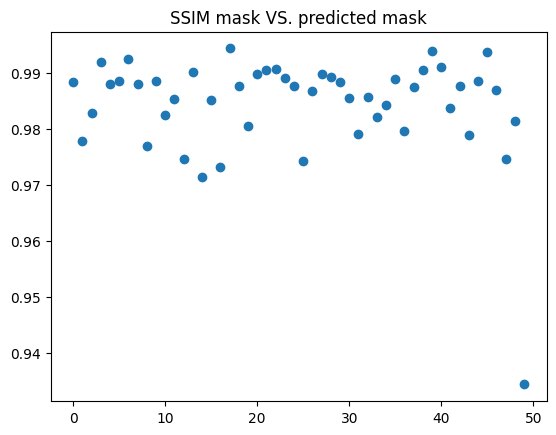

In [14]:
#results
np.mean(results)
plt.plot(results, "o")
plt.title("SSIM mask VS. predicted mask")
print(f"Moyenne : {np.mean(results)}, Médiane : {np.median(results)}")
